In [1]:
import pandas as pd
import numpy as np

In [2]:
# 아래 경로 필요에 따라 수정!
labels = pd.read_csv('/opt/ml/full_labels.csv')
labels.sample(5)

,file,gender,age,mask,map_age,class
5520,/opt/ml/input/data/train/images/001524_female_...,1,25,2,0,15
14998,/opt/ml/input/data/train/images/005421_female_...,1,48,2,1,16
15476,/opt/ml/input/data/train/images/005506_male_As...,0,25,0,0,0
7652,/opt/ml/input/data/train/images/003028_female_...,1,20,1,0,9
1641,/opt/ml/input/data/train/images/000635_female_...,1,58,0,1,4


In [3]:
labels['id'] = [path.split('/')[-2].split('_')[0] for path in labels['file']]
labels.drop("age", axis=1, inplace=True)
labels.rename(columns={'map_age':'age'},inplace=True)
labels.head()

,file,gender,mask,age,class,id
0,/opt/ml/input/data/train/images/000001_female_...,1,0,1,4,000001
1,/opt/ml/input/data/train/images/000001_female_...,1,1,1,10,000001
2,/opt/ml/input/data/train/images/000001_female_...,1,0,1,4,000001
3,/opt/ml/input/data/train/images/000001_female_...,1,0,1,4,000001
4,/opt/ml/input/data/train/images/000001_female_...,1,2,1,16,000001


In [4]:
type(labels.id[0])

str

1. Correcting Gender Labeling Error (Female Part)

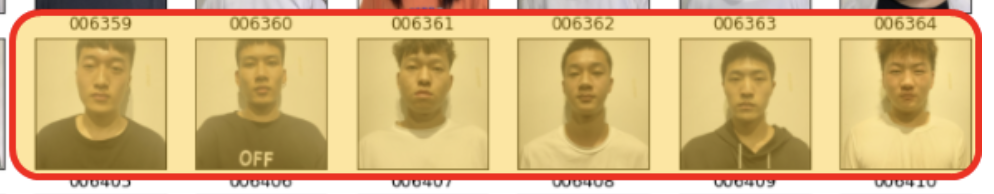

In [5]:
# correct labels female -> male
female_male = ['006359', '006360', '006361', '006362', '006363', '006364']
labels.loc[labels['id'].isin(female_male),'gender'] = 0
labels.loc[labels['id'].isin(female_male)]

,file,gender,mask,age,class,id
16793,/opt/ml/input/data/train/images/006359_female_...,0,0,0,3,006359
16794,/opt/ml/input/data/train/images/006359_female_...,0,1,0,9,006359
16795,/opt/ml/input/data/train/images/006359_female_...,0,0,0,3,006359
16796,/opt/ml/input/data/train/images/006359_female_...,0,0,0,3,006359
16797,/opt/ml/input/data/train/images/006359_female_...,0,2,0,15,006359
16798,/opt/ml/input/data/train/images/006359_female_...,0,0,0,3,006359
16799,/opt/ml/input/data/train/images/006359_female_...,0,0,0,3,006359
16800,/opt/ml/input/data/train/images/006360_female_...,0,0,0,3,006360
16801,/opt/ml/input/data/train/images/006360_female_...,0,1,0,9,006360
16802,/opt/ml/input/data/train/images/006360_female_...,0,0,0,3,006360


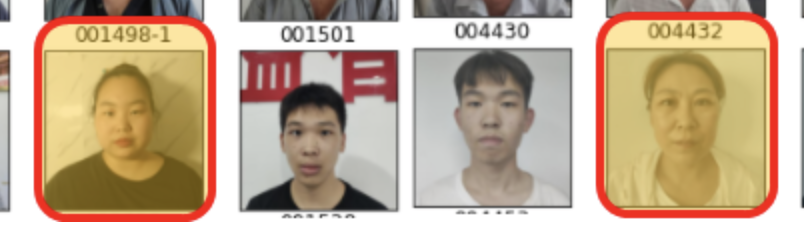

In [6]:
# correct labels male -> female
male_female = ['001498-1', '004432']
labels.loc[labels['id'].isin(male_female),'gender'] = 1
labels.loc[labels['id'].isin(male_female)]

,file,gender,mask,age,class,id
5348,/opt/ml/input/data/train/images/001498-1_male_...,1,0,0,0,001498-1
5349,/opt/ml/input/data/train/images/001498-1_male_...,1,1,0,6,001498-1
5350,/opt/ml/input/data/train/images/001498-1_male_...,1,0,0,0,001498-1
5351,/opt/ml/input/data/train/images/001498-1_male_...,1,0,0,0,001498-1
5352,/opt/ml/input/data/train/images/001498-1_male_...,1,2,0,12,001498-1
5353,/opt/ml/input/data/train/images/001498-1_male_...,1,0,0,0,001498-1
5354,/opt/ml/input/data/train/images/001498-1_male_...,1,0,0,0,001498-1
13384,/opt/ml/input/data/train/images/004432_male_As...,1,0,1,1,004432
13385,/opt/ml/input/data/train/images/004432_male_As...,1,1,1,7,004432
13386,/opt/ml/input/data/train/images/004432_male_As...,1,0,1,1,004432


2. Mask Labeling Error

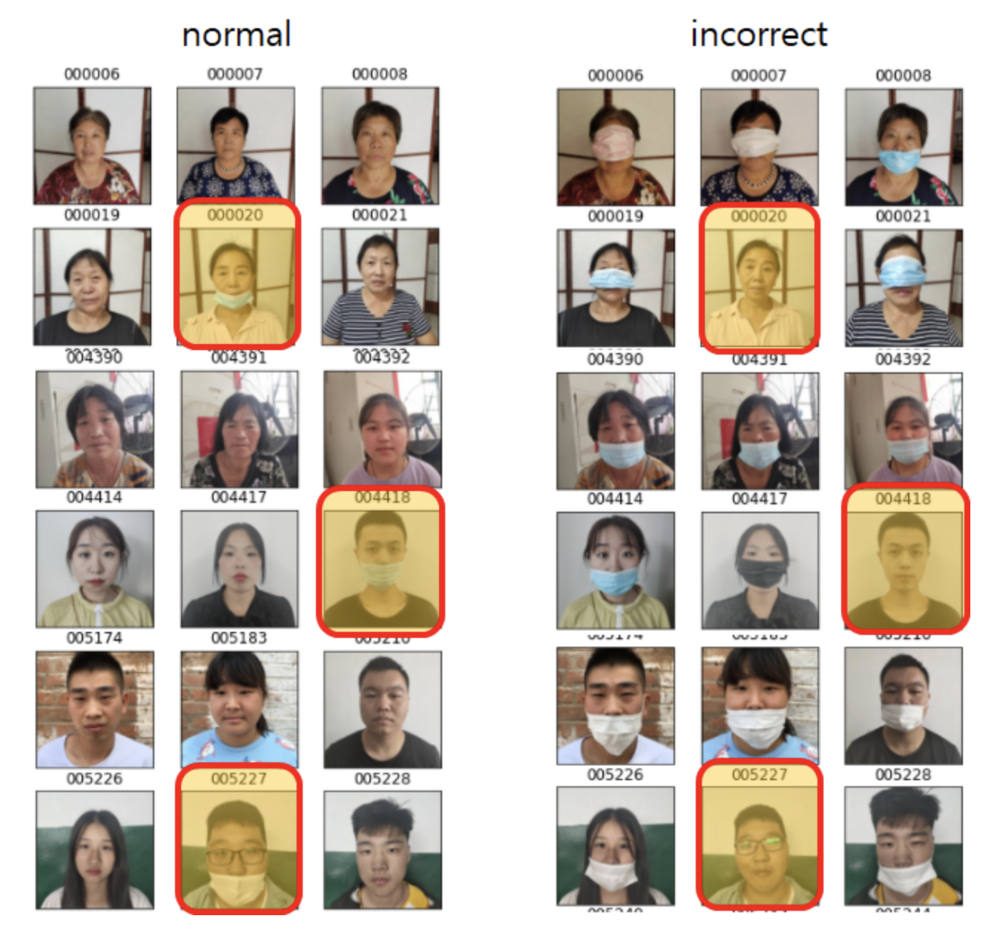

In [7]:
mask_wrong = ['000020', '004418', '005227']

In [8]:
# mask 여부 나누기 위해 확인하는 코드
labels['file'][0]

'/opt/ml/input/data/train/images/000001_female_Asian_45/mask2.jpg'

In [9]:
labels['raw_label'] = [path.split('/')[-1].split('.')[0] for path in labels['file']]
labels.loc[labels['id'].isin(mask_wrong)]

,file,gender,mask,age,class,id,raw_label
105,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask2
106,/opt/ml/input/data/train/images/000020_female_...,1,1,1,10,000020,incorrect_mask
107,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask5
108,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask1
109,/opt/ml/input/data/train/images/000020_female_...,1,2,1,16,000020,normal
110,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask3
111,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask4
13293,/opt/ml/input/data/train/images/004418_male_As...,0,0,0,0,004418,mask2
13294,/opt/ml/input/data/train/images/004418_male_As...,0,1,0,6,004418,incorrect_mask
13295,/opt/ml/input/data/train/images/004418_male_As...,0,0,0,0,004418,mask5


In [10]:
state = ['incorrect_mask', 'normal']
check_mask = labels.loc[labels['id'].isin(mask_wrong) & labels['raw_label'].isin(state), ['file', 'raw_label']]
check_mask.head(), len(check_mask)

(                                                    file       raw_label
 106    /opt/ml/input/data/train/images/000020_female_...  incorrect_mask
 109    /opt/ml/input/data/train/images/000020_female_...          normal
 13294  /opt/ml/input/data/train/images/004418_male_As...  incorrect_mask
 13297  /opt/ml/input/data/train/images/004418_male_As...          normal
 14477  /opt/ml/input/data/train/images/005227_male_As...  incorrect_mask,
 6)

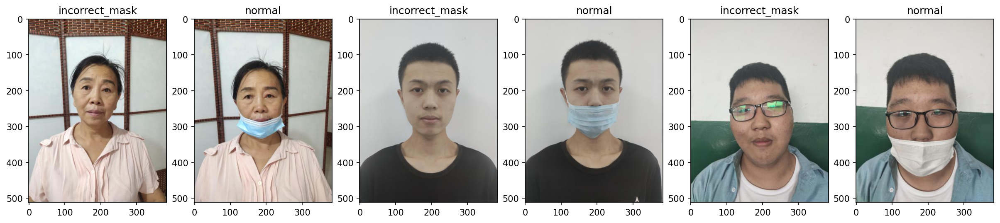

In [11]:
from matplotlib import pyplot as plt
from PIL import Image
%matplotlib inline

mask, label = check_mask['file'].tolist(), check_mask['raw_label'].tolist()

fig, axes = plt.subplots(1, 6, figsize=(20,20), dpi=150)
for i in range(6):
    im = Image.open(mask[i])
    axes[i].imshow(im)
    axes[i].set_title(label[i])
plt.show()

In [12]:
labels.loc[(labels['id'].isin(mask_wrong))&(labels['raw_label']=='incorrect_mask') ,'mask'] = 2
labels.loc[(labels['id'].isin(mask_wrong))&(labels['raw_label']=='normal') ,'mask'] = 1
# pandas 버전따라 다른지 모르겠으나 loc 함수 내에 다중 조건이 붙을 때
# df.loc[(condition1)&(condition2), column] = value
# 형태로 적어줘야 반영됨

In [13]:
labels.loc[labels['id'].isin(mask_wrong)]

,file,gender,mask,age,class,id,raw_label
105,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask2
106,/opt/ml/input/data/train/images/000020_female_...,1,2,1,10,000020,incorrect_mask
107,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask5
108,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask1
109,/opt/ml/input/data/train/images/000020_female_...,1,1,1,16,000020,normal
110,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask3
111,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask4
13293,/opt/ml/input/data/train/images/004418_male_As...,0,0,0,0,004418,mask2
13294,/opt/ml/input/data/train/images/004418_male_As...,0,2,0,6,004418,incorrect_mask
13295,/opt/ml/input/data/train/images/004418_male_As...,0,0,0,0,004418,mask5


3. Mask, Age, Gender에 맞게 class 다시 수정하기

In [14]:
labels['mod_class'] = labels['gender']*3 + labels['age'] + labels['mask']*6

In [15]:
check_id = female_male + male_female + mask_wrong
labels.loc[labels['id'].isin(check_id)].head(40)

,file,gender,mask,age,class,id,raw_label,mod_class
105,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask2,4
106,/opt/ml/input/data/train/images/000020_female_...,1,2,1,10,000020,incorrect_mask,16
107,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask5,4
108,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask1,4
109,/opt/ml/input/data/train/images/000020_female_...,1,1,1,16,000020,normal,10
110,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask3,4
111,/opt/ml/input/data/train/images/000020_female_...,1,0,1,4,000020,mask4,4
5348,/opt/ml/input/data/train/images/001498-1_male_...,1,0,0,0,001498-1,mask2,3
5349,/opt/ml/input/data/train/images/001498-1_male_...,1,1,0,6,001498-1,incorrect_mask,9
5350,/opt/ml/input/data/train/images/001498-1_male_...,1,0,0,0,001498-1,mask5,3


4. 확인

In [16]:
check_path = labels.loc[labels['id'].isin(check_id)]
len(check_path)

77

In [17]:
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

file = check_path['file']
file = file.tolist()
mod_label = check_path['mod_class']
mod_label = mod_label.tolist()
file[0], type(file[0]), mod_label[0], type(mod_label[0])

('/opt/ml/input/data/train/images/000020_female_Asian_50/mask2.jpg',
 str,
 4,
 int)

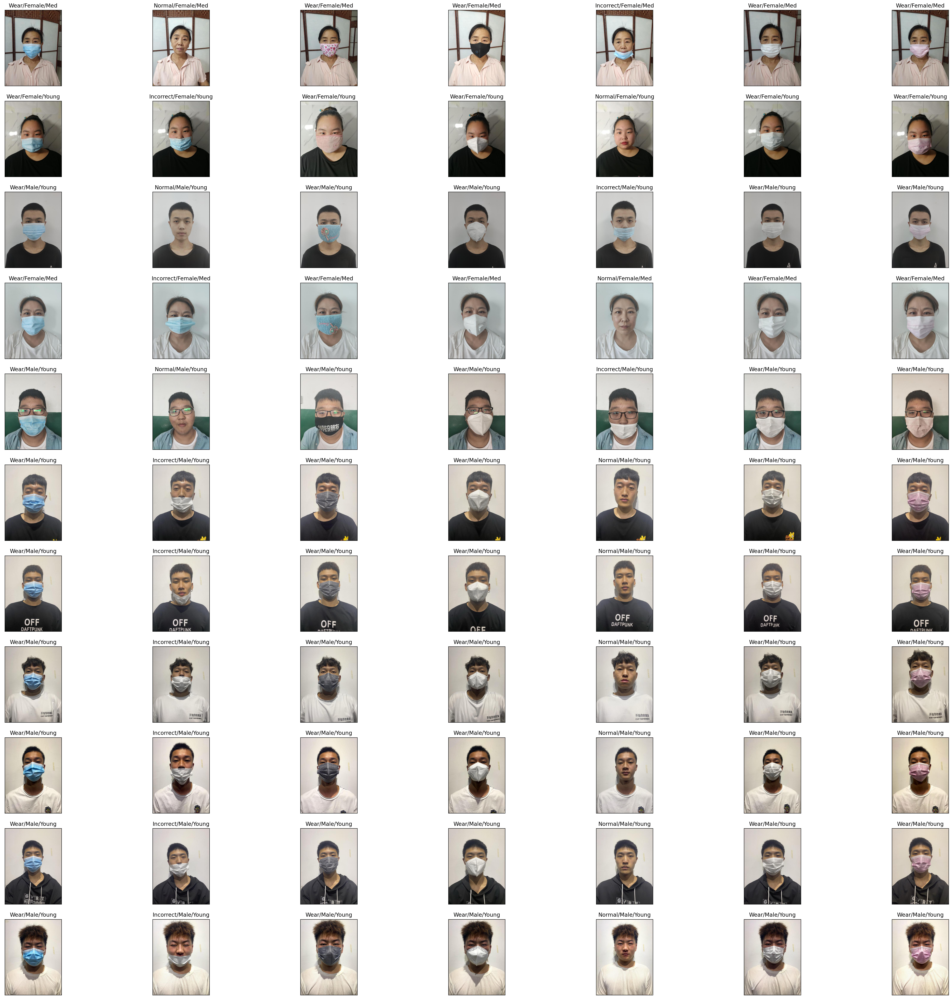

In [18]:
class_description = {0:'Wear/Male/Young', 1:'Wear/Male/Med', 2:'Wear/Male/Old',
                    3:'Wear/Female/Young', 4:'Wear/Female/Med', 5:'Wear/Female/Old',
                    6:'Incorrect/Male/Young', 7:'Incorrect/Male/Med', 8:'Incorrect/Male/Old',
                     9:'Incorrect/Female/Young', 10:'Incorrect/Female/Med', 11:'Incorrect/Female/Old',
                     12:'Normal/Male/Young', 13:'Normal/Male/Med', 14:'Normal/Male/Old',
                     15:'Normal/Female/Young', 16:'Normal/Female/Med', 17:'Normal/Female/Old'
                    }

fig, axes = plt.subplots(11, 7, figsize=(40,40), dpi=200)
# plt.subplots_adjust(left = 0, bottom = 1, right = 1, top = 2, hspace = 0, wspace = 0)
for i in range(11):
    for j in range(7):
        n = j + 7*i
        im = Image.open(file[n])
        axes[i][j].imshow(im)
        axes[i][j].set_title(class_description[mod_label[n]])
        axes[i][j].get_xaxis().set_visible(False)
        axes[i][j].get_yaxis().set_visible(False)
plt.show()

5. 바뀐 label을 correct_label.csv로 저장

In [19]:
labels.drop("class", axis=1, inplace=True)
labels.rename(columns={'mod_class':'class'},inplace=True)
labels.head()

,file,gender,mask,age,id,raw_label,class
0,/opt/ml/input/data/train/images/000001_female_...,1,0,1,000001,mask2,4
1,/opt/ml/input/data/train/images/000001_female_...,1,1,1,000001,incorrect_mask,10
2,/opt/ml/input/data/train/images/000001_female_...,1,0,1,000001,mask5,4
3,/opt/ml/input/data/train/images/000001_female_...,1,0,1,000001,mask1,4
4,/opt/ml/input/data/train/images/000001_female_...,1,2,1,000001,normal,16


In [20]:
labels.drop("raw_label", axis=1, inplace=True)
labels.head()

,file,gender,mask,age,id,class
0,/opt/ml/input/data/train/images/000001_female_...,1,0,1,000001,4
1,/opt/ml/input/data/train/images/000001_female_...,1,1,1,000001,10
2,/opt/ml/input/data/train/images/000001_female_...,1,0,1,000001,4
3,/opt/ml/input/data/train/images/000001_female_...,1,0,1,000001,4
4,/opt/ml/input/data/train/images/000001_female_...,1,2,1,000001,16


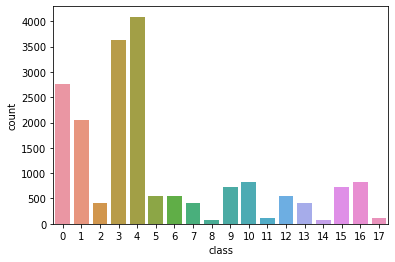

In [22]:
import seaborn as sns
sns.countplot(x='class', data=labels)

In [21]:
# 아래 경로 필요에 따라 수정
labels.to_csv('/opt/ml/correct_label.csv')
print('Done!')

Done!
